<a href="https://colab.research.google.com/github/triguiahmed/IncomeClassificationModel/blob/main/IncomeClassification-Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Income Classification Model**

Ahmed Trigui & Malek Atig Ben Salah & Mohamed Aziz Chagour & Racem Haddad

## Fetching Data

### Import Package and Data

In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn
import math
%matplotlib inline

In [6]:
income_df = pd.read_csv("income_evaluation.csv")
income_df.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [7]:
income_df.describe()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


## Data Cleaning

 ### Dealing with Missing Value

In [8]:
income_df.isnull().sum()

,0
age,0
workclass,0
fnlwgt,0
education,0
education-num,0
marital-status,0
occupation,0
relationship,0
race,0
sex,0


Attributes workclass, occupation, and native-country most NAs. Let's drop these NA.

In [9]:
income_df.age = income_df.age.astype(float)
income_df['hours-per-week'] = income_df['hours-per-week'].astype(float)

In [10]:
my_df = income_df.dropna()

In [11]:
my_df['predclass'] = my_df['income']
del my_df['income']
my_df['educational-num'] = my_df['education-num']
del my_df['education-num']


In [12]:
my_df.info()
income_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   age              32561 non-null  float64
 1   workclass        32561 non-null  object 
 2   fnlwgt           32561 non-null  int64  
 3   education        32561 non-null  object 
 4   marital-status   32561 non-null  object 
 5   occupation       32561 non-null  object 
 6   relationship     32561 non-null  object 
 7   race             32561 non-null  object 
 8   sex              32561 non-null  object 
 9   capital-gain     32561 non-null  int64  
 10  capital-loss     32561 non-null  int64  
 11  hours-per-week   32561 non-null  float64
 12  native-country   32561 non-null  object 
 13  predclass        32561 non-null  object 
 14  educational-num  32561 non-null  int64  
dtypes: float64(2), int64(4), object(9)
memory usage: 3.7+ MB
<class 'pandas.core.frame.DataFrame'>
RangeInde

In [13]:
my_df.isnull().sum()

,0
age,0
workclass,0
fnlwgt,0
education,0
marital-status,0
occupation,0
relationship,0
race,0
sex,0
capital-gain,0


## Feature Engineering

In [14]:
print('workclass',my_df.workclass.unique())
print('education',my_df.education.unique())
print('marital-status',my_df['marital-status'].unique())
print('occupation',my_df.occupation.unique())
print('relationship',my_df.relationship.unique())
print('race',my_df.race.unique())
print('sex',my_df.sex.unique())
print('native-country',my_df['native-country'].unique())
print('predclass',my_df.predclass.unique())

workclass [' State-gov' ' Self-emp-not-inc' ' Private' ' Federal-gov' ' Local-gov'
 ' ?' ' Self-emp-inc' ' Without-pay' ' Never-worked' 'Private']
education [' Bachelors' ' HS-grad' ' 11th' ' Masters' ' 9th' ' Some-college'
 ' Assoc-acdm' ' Assoc-voc' ' 7th-8th' ' Doctorate' ' Prof-school'
 ' 5th-6th' ' 10th' ' 1st-4th' ' Preschool' ' 12th']
marital-status [' Never-married' ' Married-civ-spouse' ' Divorced'
 ' Married-spouse-absent' ' Separated' ' Married-AF-spouse' ' Widowed']
occupation [' Adm-clerical' ' Exec-managerial' ' Handlers-cleaners' ' Prof-specialty'
 ' Other-service' ' Sales' ' Craft-repair' ' Transport-moving'
 ' Farming-fishing' ' Machine-op-inspct' ' Tech-support' ' ?'
 ' Protective-serv' ' Armed-Forces' ' Priv-house-serv']
relationship [' Not-in-family' ' Husband' ' Wife' ' Own-child' ' Unmarried'
 ' Other-relative']
race [' White' ' Black' ' Asian-Pac-Islander' ' Amer-Indian-Eskimo' ' Other']
sex [' Male' ' Female']
native-country [' United-States' ' Cuba' ' Jamaica' 

### Predclass

In [15]:
my_df.loc[income_df['income'] == ' >50K', 'predclass'] = 1
my_df.loc[income_df['income'] == ' <=50K', 'predclass'] = 0

In [16]:
predclass1 = my_df[my_df['predclass'] == 1]
predclass0 = my_df[my_df['predclass'] == 0]

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


<Axes: xlabel='count', ylabel='predclass'>

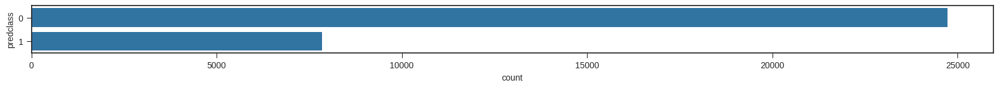

In [17]:
print(plt.style.available)
fig = plt.figure(figsize=(20,1))
plt.style.use('seaborn-v0_8-ticks')
sns.countplot(y="predclass", data=my_df)

### Education

In [18]:
income_df[['education', 'education-num']].groupby(['education'], as_index=False).mean().sort_values(by='education-num', ascending=False)

,education,education-num
10,Doctorate,16.0
14,Prof-school,15.0
12,Masters,14.0
9,Bachelors,13.0
7,Assoc-acdm,12.0
8,Assoc-voc,11.0
15,Some-college,10.0
11,HS-grad,9.0
2,12th,8.0
1,11th,7.0


In [88]:

my_df['education'] = my_df['education'].replace('Preschool', 'dropout')
my_df['education'] = my_df['education'].replace('10th', 'dropout')
my_df['education'] = my_df['education'].replace('11th', 'dropout')
my_df['education'] = my_df['education'].replace('12th', 'dropout')
my_df['education'] = my_df['education'].replace('1st-4th', 'dropout')
my_df['education'] = my_df['education'].replace('5th-6th', 'dropout')
my_df['education'] = my_df['education'].replace('7th-8th', 'dropout')
my_df['education'] = my_df['education'].replace('9th', 'dropout')
my_df['education'] = my_df['education'].replace('HS-Grad', 'HighGrad')
my_df['education'] = my_df['education'].replace('HS-grad', 'HighGrad')
my_df['education'] = my_df['education'].replace('Some-college', 'CommunityCollege')
my_df['education'] = my_df['education'].replace('Assoc-acdm', 'CommunityCollege')
my_df['education'] = my_df['education'].replace('Assoc-voc', 'CommunityCollege')
my_df['education'] = my_df['education'].replace('Bachelors', 'Bachelors')
my_df['education'] = my_df['education'].replace('Masters', 'Masters')
my_df['education'] = my_df['education'].replace('Prof-school', 'Masters')
my_df['education'] = my_df['education'].replace('Doctorate', 'Doctorate')

In [20]:
my_df[['education', 'educational-num']].groupby(['education'], as_index=False).mean().sort_values(by='educational-num', ascending=False)

,education,educational-num
10,Doctorate,16.0
14,Prof-school,15.0
12,Masters,14.0
9,Bachelors,13.0
7,Assoc-acdm,12.0
8,Assoc-voc,11.0
15,Some-college,10.0
11,HS-grad,9.0
2,12th,8.0
1,11th,7.0


<Axes: xlabel='count', ylabel='education'>

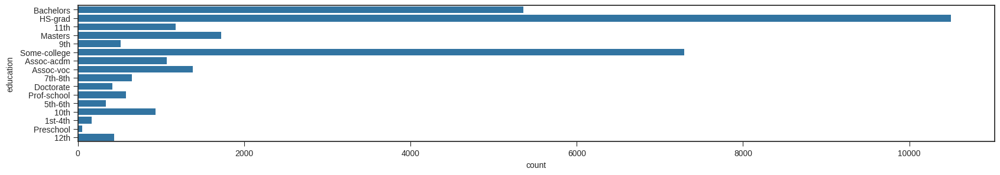

In [21]:
fig = plt.figure(figsize=(20,3))
plt.style.use('seaborn-v0_8-ticks')
sns.countplot(y="education", data=my_df)

### Marital-status

In [87]:
my_df['marital-status'] = my_df['marital-status'].replace('Never-married', 'NotMarried')
my_df['marital-status'] = my_df['marital-status'].replace(['Married-AF-spouse'], 'Married')
my_df['marital-status'] = my_df['marital-status'].replace(['Married-civ-spouse'], 'Married')
my_df['marital-status'] = my_df['marital-status'].replace(['Married-spouse-absent'], 'NotMarried')
my_df['marital-status'] = my_df['marital-status'].replace(['Separated'], 'Separated')
my_df['marital-status'] = my_df['marital-status'].replace(['Divorced'], 'Separated')
my_df['marital-status'] = my_df['marital-status'].replace(['Widowed'], 'Widowed')

<Axes: xlabel='count', ylabel='marital-status'>

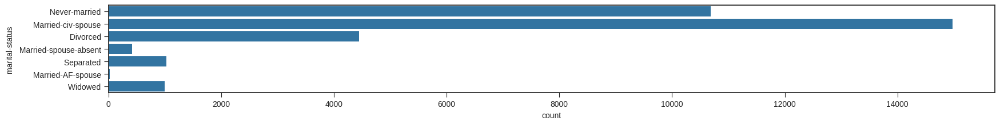

In [23]:
fig = plt.figure(figsize=(20,2))
plt.style.use('seaborn-v0_8-ticks')
sns.countplot(y="marital-status", data=my_df)

### Occupation

<Axes: xlabel='count', ylabel='occupation'>

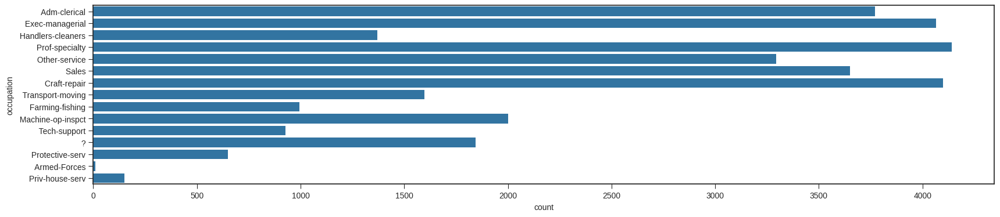

In [24]:
plt.style.use('seaborn-v0_8-ticks')
plt.figure(figsize=(20,4))
sns.countplot(y="occupation", data=my_df)

### Workclass

<Axes: xlabel='count', ylabel='workclass'>

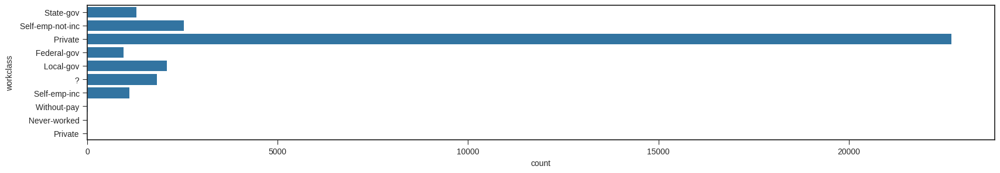

In [25]:
plt.style.use('seaborn-v0_8-ticks')
plt.figure(figsize=(20,3))
sns.countplot(y="workclass", data=my_df)

In [ ]:
# grid = sns.FacetGrid(train_df, col='Pclass', hue='Survived')
# grid = sns.FacetGrid(my_df, col='predclass', row='workclass', size=2.2, aspect=1.6)
# grid.map(plt.hist, 'age', alpha=.5, bins=20)
# grid.add_legend()

### age

In [27]:
# make the age variable discretized
my_df['age_bin'] = pd.cut(my_df['age'], 20)

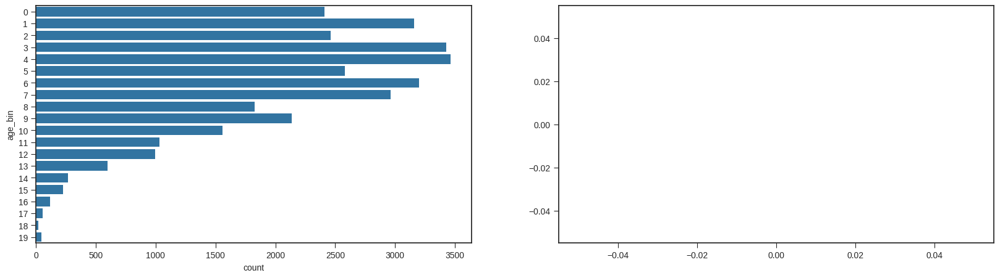

In [86]:
import seaborn as sns
import matplotlib.pyplot as plt

# Use Seaborn's new style and plot
plt.style.use('seaborn-v0_8-ticks')
fig = plt.figure(figsize=(20,5))

# First subplot: Countplot of 'age_bin'
plt.subplot(1, 2, 1)
sns.countplot(y="age_bin", data=my_df)

# Second subplot: Histograms and KDEs for 'age' based on 'predclass'
plt.subplot(1, 2, 2)
sns.histplot(my_df[my_df['predclass'] == ' >50K']['age'], kde=True, label=" >50K")
sns.histplot(my_df[my_df['predclass'] == ' <=50K']['age'], kde=True, label=" <=50K")

# Adjusting the plot for better display
plt.legend()
plt.show()


In [29]:
my_df[['predclass', 'age']].groupby(['predclass'], as_index=False).mean().sort_values(by='age', ascending=False)

,predclass,age
1,1,44.249841
0,0,36.783738


### Race

<Axes: xlabel='race', ylabel='prop'>

<Figure size 2000x500 with 0 Axes>

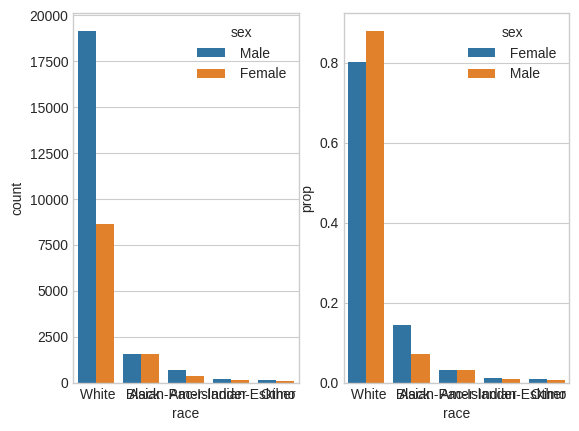

In [30]:
plt.style.use('seaborn-v0_8-whitegrid')

x, y, hue = "race", "prop", "sex"
#hue_order = ["Male", "Female"]
plt.figure(figsize=(20,5))
f, axes = plt.subplots(1, 2)
sns.countplot(x=x, hue=hue, data=my_df, ax=axes[0])

prop_df = (my_df[x]
           .groupby(my_df[hue])
           .value_counts(normalize=True)
           .rename(y)
           .reset_index())

sns.barplot(x=x, y=y, hue=hue, data=prop_df, ax=axes[1])


### Hours of Work

In [31]:
# Let's use the Pandas Cut function to bin the data in equally sized buckets
my_df['hours-per-week_bin'] = pd.cut(my_df['hours-per-week'], 10)
my_df['hours-per-week'] = my_df['hours-per-week']

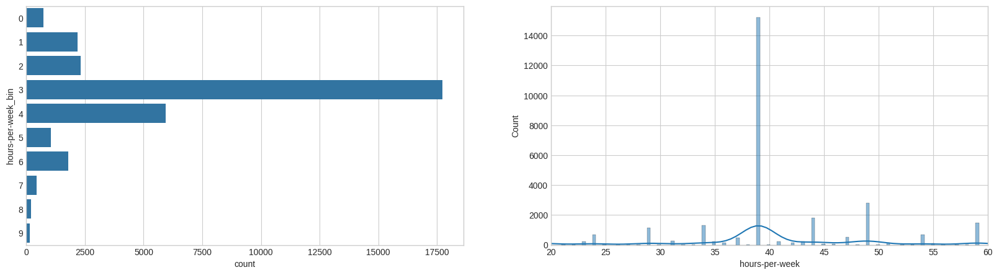

In [74]:
import seaborn as sns
import matplotlib.pyplot as plt

# Use Seaborn's new function `histplot` instead of `distplot`
plt.style.use('seaborn-v0_8-whitegrid')

fig = plt.figure(figsize=(20, 5))

# First subplot: Countplot of 'hours-per-week_bin'
plt.subplot(1, 2, 1)
sns.countplot(y="hours-per-week_bin", data=my_df)

# Second subplot: Histograms for 'hours-per-week' and KDEs for the two categories
plt.subplot(1, 2, 2)
sns.histplot(my_df['hours-per-week'], kde=True)  # Histogram with KDE
sns.histplot(my_df[my_df['predclass'] == '>50K']['hours-per-week'], kde=True, label=">$50K")
sns.histplot(my_df[my_df['predclass'] == '<=50K']['hours-per-week'], kde=True, label="<$50K")

# Adjusting the limits for better view
plt.ylim(0, None)
plt.xlim(20, 60)

# Display the plot
plt.legend()
plt.show()


### Create a crossing feature: Age + hour of work

<Axes: xlabel='age', ylabel='hours-per-week'>

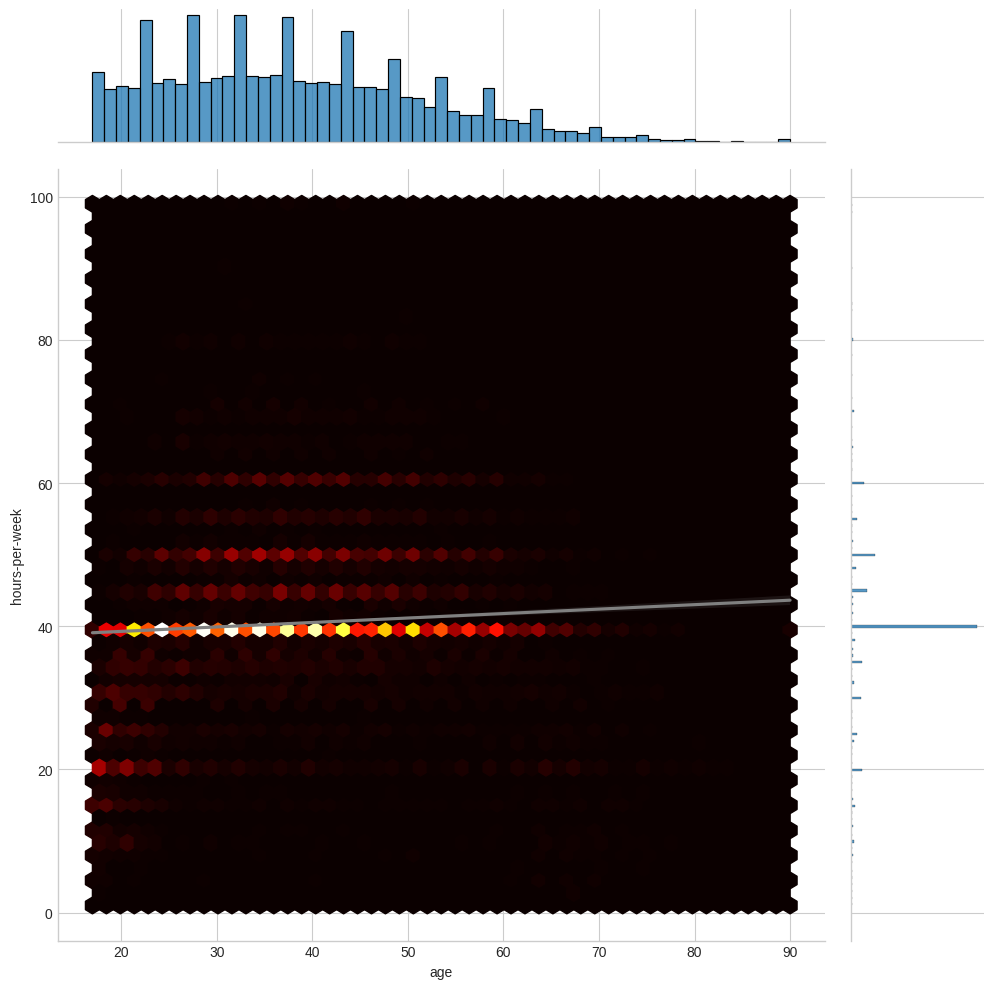

In [33]:
g = sns.jointplot(
    x='age',
    y='hours-per-week',
    data=my_df,
    kind='hex',
    cmap='hot',
    height=10
)

sns.regplot(
    x='age',
    y='hours-per-week',
    data=my_df,
    ax=g.ax_joint,
    scatter=False,
    color='grey'
)

In [34]:
my_df.head()

,age,workclass,fnlwgt,education,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,predclass,educational-num,age_bin,hours-per-week_bin
0,39.0,State-gov,77516,Bachelors,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40.0,United-States,0,13,"(38.9, 42.55]","(30.4, 40.2]"
1,50.0,Self-emp-not-inc,83311,Bachelors,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13.0,United-States,0,13,"(49.85, 53.5]","(10.8, 20.6]"
2,38.0,Private,215646,HS-grad,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40.0,United-States,0,9,"(35.25, 38.9]","(30.4, 40.2]"
3,53.0,Private,234721,11th,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40.0,United-States,0,7,"(49.85, 53.5]","(30.4, 40.2]"
4,28.0,Private,338409,Bachelors,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40.0,Cuba,0,13,"(27.95, 31.6]","(30.4, 40.2]"


In [35]:
# Crossing Numerical Features
my_df['age-hours'] = my_df['age']*my_df['hours-per-week']
my_df['age-hours_bin'] = pd.cut(my_df['age-hours'], 10)

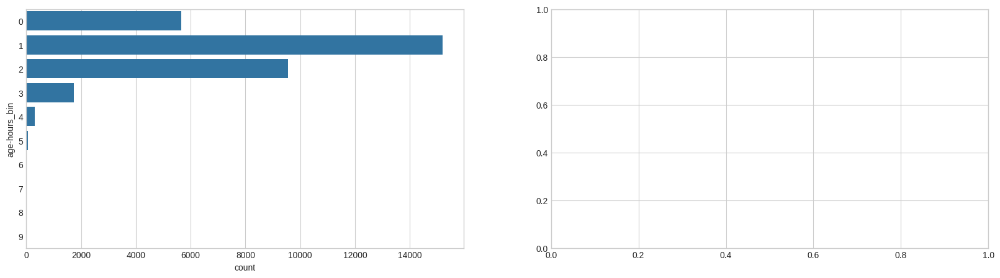

In [62]:
import seaborn as sns
import matplotlib.pyplot as plt

my_df = my_df.dropna(subset=['age-hours'])

plt.style.use('seaborn-v0_8-whitegrid')

fig = plt.figure(figsize=(20,5))

# Subplot 1: Count plot for 'age-hours_bin'
plt.subplot(1, 2, 1)
sns.countplot(y="age-hours_bin", data=my_df)

# Subplot 2: Histograms for '>50K' and '<=50K' categories
plt.subplot(1, 2, 2)
sns.histplot(my_df[my_df['predclass'] == '>50K']['age-hours'], kde=True, label=">$50K", color="blue", stat="density")
sns.histplot(my_df[my_df['predclass'] == '<=50K']['age-hours'], kde=True, label="<$50K", color="orange", stat="density")

plt.legend()
plt.show()


## EDA

### Pair Plot

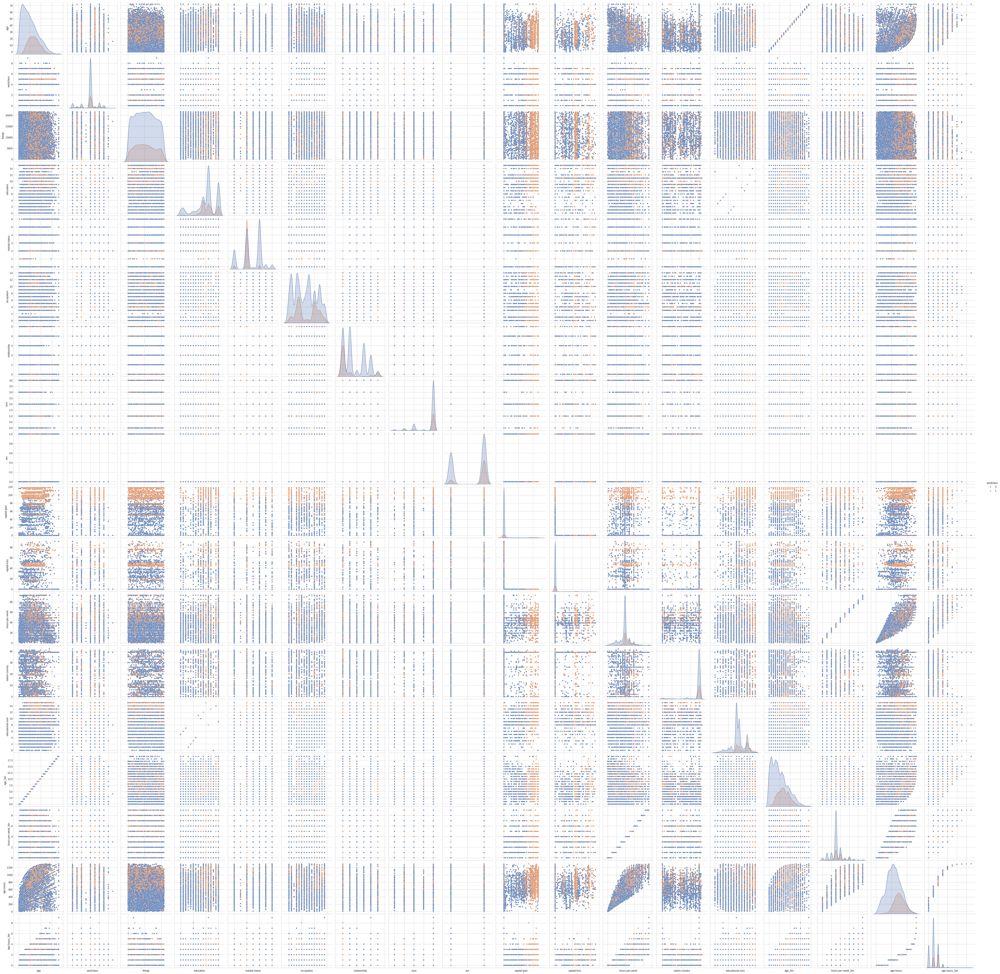

In [72]:
#pair plots of entire dataset (takes time)
import seaborn as sns
pp = sns.pairplot(my_df, hue='predclass', palette='deep',
                  height=3, diag_kind='kde', diag_kws=dict(fill=True), plot_kws=dict(s=20))
pp.set(xticklabels=[])


### Correlation Heatmap

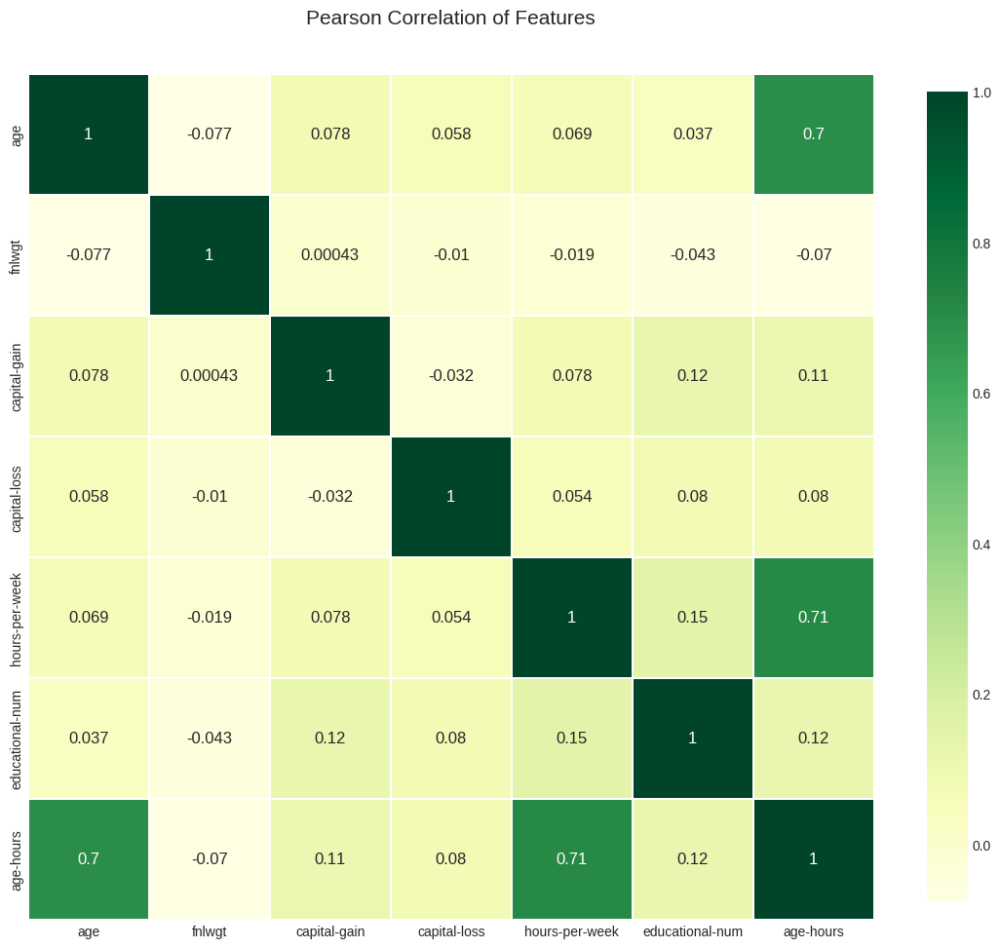

In [38]:
#correlation heatmap of dataset
def correlation_heatmap(df):
    # Select only numeric columns
    numeric_df = df.select_dtypes(include='number')

    # Create the heatmap
    _ , ax = plt.subplots(figsize=(14, 12))
    colormap = sns.diverging_palette(220, 10, as_cmap=True)

    _ = sns.heatmap(
        numeric_df.corr(),
        cmap="YlGn",
        square=True,
        cbar_kws={'shrink': .9},
        ax=ax,
        annot=True,
        linewidths=0.1, vmax=1.0, linecolor='white',
        annot_kws={'fontsize': 12}
    )

    plt.title('Pearson Correlation of Features', y=1.05, size=15)

# Call the function with your DataFrame
correlation_heatmap(my_df)


### Bivariate Analysis

In [39]:
my_df.tail()

,age,workclass,fnlwgt,education,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,predclass,educational-num,age_bin,hours-per-week_bin,age-hours,age-hours_bin
32556,27.0,Private,257302,Assoc-acdm,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38.0,United-States,0,12,"(24.3, 27.95]","(30.4, 40.2]",1026.0,"(909.9, 1798.8]"
32557,40.0,Private,154374,HS-grad,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40.0,United-States,1,9,"(38.9, 42.55]","(30.4, 40.2]",1600.0,"(909.9, 1798.8]"
32558,58.0,Private,151910,HS-grad,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40.0,United-States,0,9,"(57.15, 60.8]","(30.4, 40.2]",2320.0,"(1798.8, 2687.7]"
32559,22.0,Private,201490,HS-grad,Never-married,Adm-clerical,Own-child,White,Male,0,0,20.0,United-States,0,9,"(20.65, 24.3]","(10.8, 20.6]",440.0,"(12.111, 909.9]"
32560,52.0,Self-emp-inc,287927,HS-grad,Married-civ-spouse,Exec-managerial,Wife,White,Female,15024,0,40.0,United-States,1,9,"(49.85, 53.5]","(30.4, 40.2]",2080.0,"(1798.8, 2687.7]"


In [73]:
import math
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def plot_bivariate_bar(dataset, hue, cols=5, width=20, height=15, hspace=0.2, wspace=0.5):
    # Update to use `object` instead of `np.object`
    dataset = dataset.select_dtypes(include=[object])
    fig = plt.figure(figsize=(width, height))
    fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=wspace, hspace=hspace)
    rows = math.ceil(float(dataset.shape[1]) / cols)

    for i, column in enumerate(dataset.columns):
        ax = fig.add_subplot(rows, cols, i + 1)
        ax.set_title(column)
        if dataset.dtypes[column] == object:
            g = sns.countplot(y=column, hue=hue, data=dataset, ax=ax)
            substrings = [s.get_text()[:10] for s in g.get_yticklabels()]
            g.set(yticklabels=substrings)

    plt.show()  # Explicitly show the plot

# Usage
bivariate_df = my_df.loc[:, ['workclass', 'education',
                              'marital-status', 'occupation',
                              'relationship', 'race', 'sex', 'predclass']]

plot_bivariate_bar(bivariate_df, hue='predclass', cols=2, width=20, height=15, hspace=0.4, wspace=0.5)


<Figure size 2000x1500 with 0 Axes>

### Occupation vs. Income Level

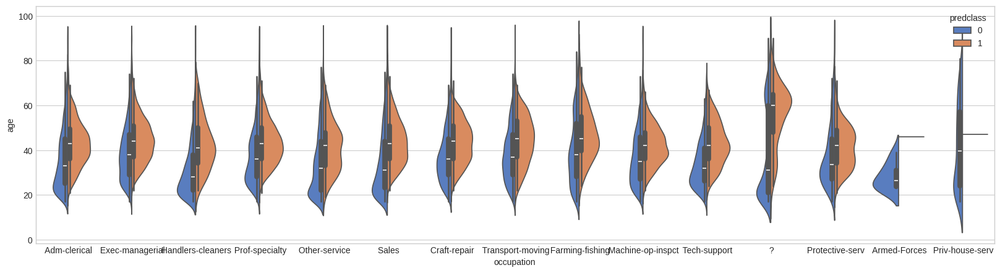

In [45]:
import matplotlib.pyplot as plt
import seaborn as sns

a4_dims = (20, 5)
fig, ax = plt.subplots(figsize=a4_dims)
ax = sns.violinplot(
    x="occupation",
    y="age",
    hue="predclass",
    data=my_df,
    gridsize=100,
    palette="muted",
    split=True,
    saturation=0.75
)
plt.show()

*italicized text*### Race vs. Income Level

<Axes: xlabel='race', ylabel='age'>

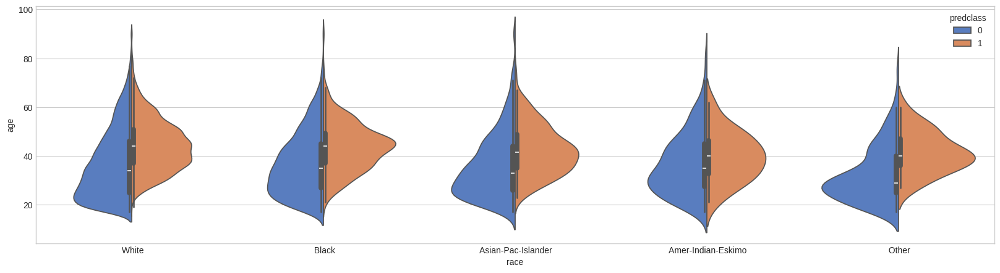

In [46]:
from matplotlib import pyplot
a4_dims = (20, 5)
fig, ax = pyplot.subplots(figsize=a4_dims)
ax = sns.violinplot(x="race", y="age", hue="predclass",
                    data=my_df, gridsize=100, palette="muted", split=True, saturation=0.75)
ax

## Building Machine Learning Models

In [47]:
from sklearn.cluster import KMeans
from matplotlib import cm
from sklearn.metrics import silhouette_samples
from sklearn.metrics import silhouette_score
from sklearn.metrics import accuracy_score

from sklearn.decomposition import PCA
from pandas.plotting import scatter_matrix
from mpl_toolkits.mplot3d import Axes3D

from sklearn.model_selection import GridSearchCV


#importing all the required ML packages
from sklearn.linear_model import LogisticRegression #logistic regression
from sklearn import svm #support vector Machine
from sklearn.ensemble import RandomForestClassifier #Random Forest
from sklearn.neighbors import KNeighborsClassifier #KNN
from sklearn.naive_bayes import GaussianNB #Naive bayes
from sklearn.tree import DecisionTreeClassifier #Decision Tree
from sklearn import metrics #accuracy measure
from sklearn.metrics import confusion_matrix #for confusion matrix
#train,test=train_test_split(train_df,test_size=0.2,random_state=0,stratify=abalone_data['Sex'])

### Feature Encoding

In [48]:
# Feature Selection and Encoding
from sklearn.svm import SVR
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split #training and testing data split


In [49]:
my_df = my_df.apply(LabelEncoder().fit_transform)
my_df.head()

,age,workclass,fnlwgt,education,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,predclass,educational-num,age_bin,hours-per-week_bin,age-hours,age-hours_bin
0,22,7,2671,9,4,1,1,4,1,25,0,39,39,0,12,6,3,631,1
1,33,6,2926,9,2,4,0,4,1,0,0,12,39,0,12,9,1,290,0
2,21,4,14086,11,0,6,1,4,1,0,0,39,39,0,8,5,3,620,1
3,36,4,15336,1,2,6,0,2,1,0,0,39,39,0,6,9,3,810,2
4,11,4,19355,9,2,10,5,2,0,0,0,39,5,0,12,3,3,477,1


### Train-test split

In [50]:
drop_elements = ['education', 'native-country', 'predclass', 'age_bin', 'age-hours_bin','hours-per-week_bin']
y = my_df["predclass"]
X = my_df.drop(drop_elements, axis=1)
X.head()

,age,workclass,fnlwgt,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,educational-num,age-hours
0,22,7,2671,4,1,1,4,1,25,0,39,12,631
1,33,6,2926,2,4,0,4,1,0,0,12,12,290
2,21,4,14086,0,6,1,4,1,0,0,39,8,620
3,36,4,15336,2,6,0,2,1,0,0,39,6,810
4,11,4,19355,2,10,5,2,0,0,0,39,12,477


In [51]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2)

### Principal Component Analysis (PCA)

In [52]:
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler


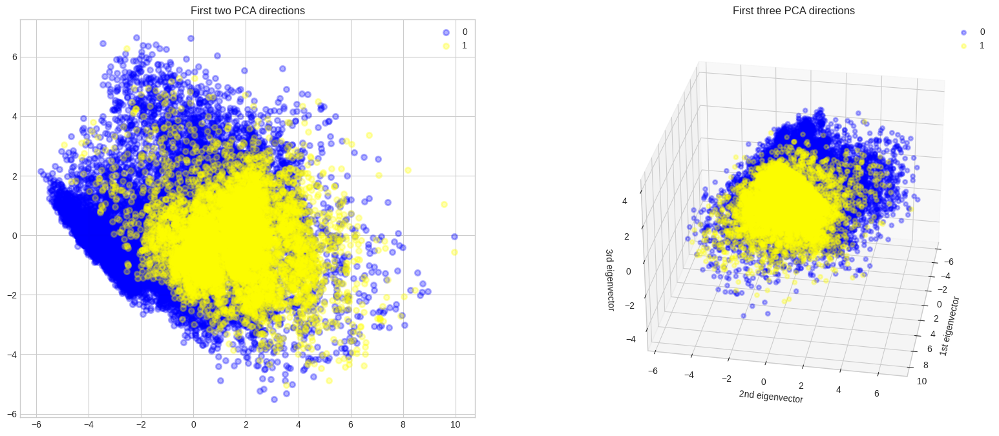

In [53]:
# PCA's components graphed in 2D and 3D
# Apply Scaling
std_scale = preprocessing.StandardScaler().fit(my_df.drop('predclass', axis=1))
X = std_scale.transform(my_df.drop('predclass', axis=1))
y = my_df['predclass']

# Formatting
target_names = [0,1]
colors = ['blue','yellow','pink']
lw = 2
alpha = 0.3
# 2 Components PCA
plt.style.use('seaborn-v0_8-whitegrid')

plt.figure(2, figsize=(20, 8))

plt.subplot(1, 2, 1)
pca = PCA(n_components=2)
X_r = pca.fit(X).transform(X)
for color, i, target_name in zip(colors, [0, 1], target_names):
    plt.scatter(X_r[y == i, 0], X_r[y == i, 1],
                color=color,
                alpha=alpha,
                lw=lw,
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('First two PCA directions');

# 3 Components PCA
ax = plt.subplot(1, 2, 2, projection='3d')

pca = PCA(n_components=3)
X_reduced = pca.fit(X).transform(X)
for color, i, target_name in zip(colors, [0, 1], target_names):
    ax.scatter(X_reduced[y == i, 0], X_reduced[y == i, 1], X_reduced[y == i, 2],
               color=color,
               alpha=alpha,
               lw=lw,
               label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
ax.set_title("First three PCA directions")
ax.set_xlabel("1st eigenvector")
ax.set_ylabel("2nd eigenvector")
ax.set_zlabel("3rd eigenvector")

# rotate the axes
ax.view_init(30, 10)

In [54]:
sc = StandardScaler()
X_train_std = sc.fit_transform(X_train)
pca = PCA(n_components=None)
x_train_pca = pca.fit_transform(X_train_std)
a = pca.explained_variance_ratio_
a_running = a.cumsum()
a_running

array([0.21140965, 0.31530115, 0.40935124, 0.49088877, 0.57058801,
       0.64779172, 0.7214378 , 0.7918589 , 0.85443005, 0.91411691,
       0.96824948, 0.99798581, 1.        ])

### Classification Models

#### Linear Support Vector Machine

In [55]:
# Support Vector Classifier (SVM/SVC)
from sklearn.svm import SVC
svc = SVC(gamma=0.22)
svc.fit(X_train, y_train)
#y_pred = logreg.predict(X_test)
score_svc = svc.score(X_test,y_test)
print('The accuracy of SVC is', score_svc)

The accuracy of SVC is 0.7571011822508829


#### Radical Support Vector Machine

In [56]:
svc_radical =svm.SVC(kernel='rbf',C=1,gamma=0.22)
svc_radical.fit(X_train,y_train.values.ravel())
score_svc_radical = svc_radical.score(X_test,y_test)
print('The accuracy of Radical SVC Model is', score_svc_radical)

The accuracy of Radical SVC Model is 0.7571011822508829


#### Logistic Regression

In [61]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

# Scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Logistic Regression with increased max_iter
logreg = LogisticRegression(max_iter=500)  # Increased max_iter
logreg.fit(X_train_scaled, y_train)
score_logreg = logreg.score(X_test_scaled, y_test)

print('The accuracy of the Logistic Regression is', score_logreg)


The accuracy of the Logistic Regression is 0.8223552894211577


#### Random Forest

In [58]:
# Random Forest Classifier
randomforest = RandomForestClassifier()
randomforest.fit(X_train, y_train)
#y_pred = randomforest.predict(X_test)
score_randomforest = randomforest.score(X_test,y_test)
print('The accuracy of the Random Forest Model is', score_randomforest)

The accuracy of the Random Forest Model is 0.8515277138031629


#### K-Nearest Neighbors

In [59]:
# K-Nearest Neighbors
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)
#y_pred = knn.predict(X_test)
score_knn = knn.score(X_test,y_test)
print('The accuracy of the KNN Model is',score_knn)

The accuracy of the KNN Model is 0.7580224167050514


### Cross Validation

In [ ]:
from sklearn.model_selection import KFold  # for K-fold cross-validation
from sklearn.model_selection import cross_val_score  # score evaluation
from sklearn.model_selection import cross_val_predict  # prediction
from sklearn.naive_bayes import GaussianNB
from sklearn import svm
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
import pandas as pd

# Apply Scaling (Ensure X and y are defined properly before this step)
kfold = KFold(n_splits=10, shuffle=True, random_state=22)  # Set shuffle=True

xyz = []
accuracy = []
std = []
classifiers = [ 'Linear Svm', 'Radial Svm', 'Logistic Regression', 'KNN', 'Random Forest']
models = [
    GaussianNB(),
    svm.SVC(kernel='linear'),
    svm.SVC(kernel='rbf'),
    LogisticRegression(max_iter=1000),
    DecisionTreeClassifier(),
    KNeighborsClassifier(n_neighbors=9),
    RandomForestClassifier(n_estimators=100)
]

# Iterate through models
for model in models:
    cv_result = cross_val_score(model, X, y, cv=kfold, scoring="accuracy")
    xyz.append(cv_result.mean())
    std.append(cv_result.std())
    accuracy.append(cv_result)

# Create a DataFrame to show results
models_dataframe = pd.DataFrame({'CV Mean': xyz, 'Std': std}, index=classifiers)
print(models_dataframe)
